In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
%matplotlib inline 


In [8]:
df=pd.read_csv("..\data\Simplified Citation After 2015 July to 2019.csv")
df.head()

,Unnamed: 0,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude
0,28,4361326712,2019/09/17 12:00:00 AM,1205.0,NaN,NaN,CA,NaN,TOYT,PA,GY,309 WINDWARD AVE,00163,51.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.419487e+06,1.818861e+06
1,112,4361286823,2019/09/17 12:00:00 AM,853.0,NaN,NaN,CA,NaN,TOYT,PA,WT,934 84TH ST W,00553,55.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.473690e+06,1.808839e+06
2,224,4361159515,2019/09/17 12:00:00 AM,833.0,NaN,NaN,CA,NaN,NISS,PA,WT,2601 MONMOUTH AVE,00536,55.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.475329e+06,1.834194e+06
3,473,4361237226,2019/09/17 12:00:00 AM,1015.0,NaN,NaN,CA,NaN,HOND,PA,RD,615 HAMPTON DR,00133,51.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.417752e+06,1.820642e+06
4,592,4360129196,2019/09/17 12:00:00 AM,1007.0,NaN,NaN,CA,NaN,VOLV,PA,SL,1346 MCCADDEN PL N,00487,54.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.459495e+06,1.857205e+06


In [9]:
df["Date"] = df["Issue Date"].apply(lambda x: x.split()[0])
df.head()

,Unnamed: 0,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Date
0,28,4361326712,2019/09/17 12:00:00 AM,1205.0,NaN,NaN,CA,NaN,TOYT,PA,GY,309 WINDWARD AVE,00163,51.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.419487e+06,1.818861e+06,2019/09/17
1,112,4361286823,2019/09/17 12:00:00 AM,853.0,NaN,NaN,CA,NaN,TOYT,PA,WT,934 84TH ST W,00553,55.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.473690e+06,1.808839e+06,2019/09/17
2,224,4361159515,2019/09/17 12:00:00 AM,833.0,NaN,NaN,CA,NaN,NISS,PA,WT,2601 MONMOUTH AVE,00536,55.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.475329e+06,1.834194e+06,2019/09/17
3,473,4361237226,2019/09/17 12:00:00 AM,1015.0,NaN,NaN,CA,NaN,HOND,PA,RD,615 HAMPTON DR,00133,51.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.417752e+06,1.820642e+06,2019/09/17
4,592,4360129196,2019/09/17 12:00:00 AM,1007.0,NaN,NaN,CA,NaN,VOLV,PA,SL,1346 MCCADDEN PL N,00487,54.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.459495e+06,1.857205e+06,2019/09/17


In [34]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 7570561 entries, 0 to 8706411
Data columns (total 20 columns):
Ticket number            object
Issue Date               object
Issue time               float64
Meter Id                 object
Marked Time              float64
RP State Plate           object
VIN                      float64
Make                     object
Body Style               object
Color                    object
Location                 object
Route                    object
Agency                   float64
Violation code           object
Violation Description    object
Fine amount              object
Latitude                 float64
Longitude                float64
Date                     object
geometry                 geometry
dtypes: float64(6), geometry(1), object(13)
memory usage: 1.2+ GB


In [10]:
df.describe()

,Unnamed: 0,Ticket number,Issue time,Marked Time,VIN,Agency,Fine amount,Latitude,Longitude
count,8.755400e+04,8.755400e+04,87539.000000,2806.000000,0.0,87554.000000,87502.000000,8.755400e+04,8.755400e+04
mean,4.358450e+06,4.141587e+09,1193.511007,1052.229152,NaN,52.003952,70.194316,5.627043e+06,1.620545e+06
std,2.515523e+06,7.158483e+08,475.233027,238.409221,NaN,9.335395,32.052942,2.140339e+06,5.893937e+05
min,2.800000e+01,1.006079e+09,1.000000,2.000000,NaN,1.000000,10.000000,9.999900e+04,9.999900e+04
25%,2.182563e+06,4.281948e+09,906.000000,904.000000,NaN,51.000000,63.000000,6.423939e+06,1.826009e+06
50%,4.357787e+06,4.308346e+09,1148.000000,1035.000000,NaN,54.000000,68.000000,6.453559e+06,1.842359e+06
75%,6.532856e+06,4.332527e+09,1459.000000,1200.000000,NaN,55.000000,73.000000,6.475587e+06,1.858205e+06
max,8.706345e+06,4.361364e+09,2359.000000,2335.000000,NaN,58.000000,363.000000,6.513150e+06,1.941866e+06


In [11]:
df['Agency'].unique()

array([51., 55., 54., 53., 56.,  2., 58., 57.,  1.,  4., 11., 36.,  3.,
       34., 40.,  5.,  6.])

In [12]:
df['Agency'].value_counts()

54.0    21314
51.0    19573
56.0    18571
53.0    15699
55.0     9135
1.0      2002
2.0       444
57.0      290
4.0       268
58.0       89
36.0       47
3.0        43
40.0       38
11.0       35
34.0        4
5.0         1
6.0         1
Name: Agency, dtype: int64

In [21]:
df['Route'].value_counts().head(100)

00600    570083
00500    330210
00401    149844
00402    148562
00403    106790
00315    102279
00309     87376
00400     72328
00483     68891
00107     64616
00310     62530
00300     59211
00356     58162
00111     57152
402A      53917
00471     52163
00472     50450
00474     46241
00141     43880
00610     43812
00442     42898
00441     41778
00667     40495
00321     40206
00476     39905
00363     38778
00601     38734
00642     38671
00361     38061
00201     37101
          ...  
00353     26117
00152     26107
00354     25436
00131     24998
00204     24451
00686     24434
00645     24341
00463     24224
00358     24129
00155     24019
00644     23969
00481     23643
00143     23624
00351     23545
00134     23415
00147     23339
00151     23253
00636     23163
00174     22496
00355     22496
00677     22320
401A      22255
6T8       22173
00137     22063
350R1     21659
00675     21623
00161     21613
00145     21505
00448     21431
00146     21408
Name: Route, Length: 100

In [13]:
df['Agency'].nunique()

17

In [14]:
df[df["Agency"] == 54]["Route"].nunique()

255

In [15]:
df[df["Agency"] == 51]["Route"].nunique()

288

In [16]:
df[df["Agency"] == 56]["Route"].nunique()

183

In [17]:
df[df["Agency"] == 53]["Route"].nunique()

184

In [24]:
df[df["Agency"] == 55]["Route"].nunique()

218

In [20]:
df["Route"].value_counts().shape

(1772,)

In [21]:
df=df[df['Latitude']!=99999]
df=df[df['Longitude']!=99999]
print(df['Latitude'].min(), df['Latitude'].max())
print(df['Longitude'].min(), df['Longitude'].max())

6360389.99777888 6513149.50780289
1715644.4 1941866.264895


In [22]:
import geopandas
from geopandas import GeoDataFrame
from shapely.geometry import Point


In [23]:
geometry = [Point(xy) for xy in zip(df["Latitude"],df["Longitude"])] 
geometry[:3]

In [24]:
crs = {'init': 'epsg:4269'} #epsg:4362(WGS84) # crs= coordinate reference system 
df = geopandas.GeoDataFrame(df,crs = crs, geometry= geometry)
df.head()

,Unnamed: 0,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,...,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Date,geometry
0,28,4361326712,2019/09/17 12:00:00 AM,1205.0,NaN,NaN,CA,NaN,TOYT,PA,...,309 WINDWARD AVE,00163,51.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.419487e+06,1.818861e+06,2019/09/17,POINT (6419487.346 1818860.518)
1,112,4361286823,2019/09/17 12:00:00 AM,853.0,NaN,NaN,CA,NaN,TOYT,PA,...,934 84TH ST W,00553,55.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.473690e+06,1.808839e+06,2019/09/17,POINT (6473689.884 1808838.586)
2,224,4361159515,2019/09/17 12:00:00 AM,833.0,NaN,NaN,CA,NaN,NISS,PA,...,2601 MONMOUTH AVE,00536,55.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.475329e+06,1.834194e+06,2019/09/17,POINT (6475329.075 1834193.637)
3,473,4361237226,2019/09/17 12:00:00 AM,1015.0,NaN,NaN,CA,NaN,HOND,PA,...,615 HAMPTON DR,00133,51.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.417752e+06,1.820642e+06,2019/09/17,POINT (6417752.445 1820641.850)
4,592,4360129196,2019/09/17 12:00:00 AM,1007.0,NaN,NaN,CA,NaN,VOLV,PA,...,1346 MCCADDEN PL N,00487,54.0,80.69BS,NO PARK/STREET CLEAN,73.0,6.459495e+06,1.857205e+06,2019/09/17,POINT (6459494.955 1857204.982)


In [25]:
# plot two specific routes
route_6T8=df['Route']=='6T8'
route_350R1=df['Route']=='350R1'

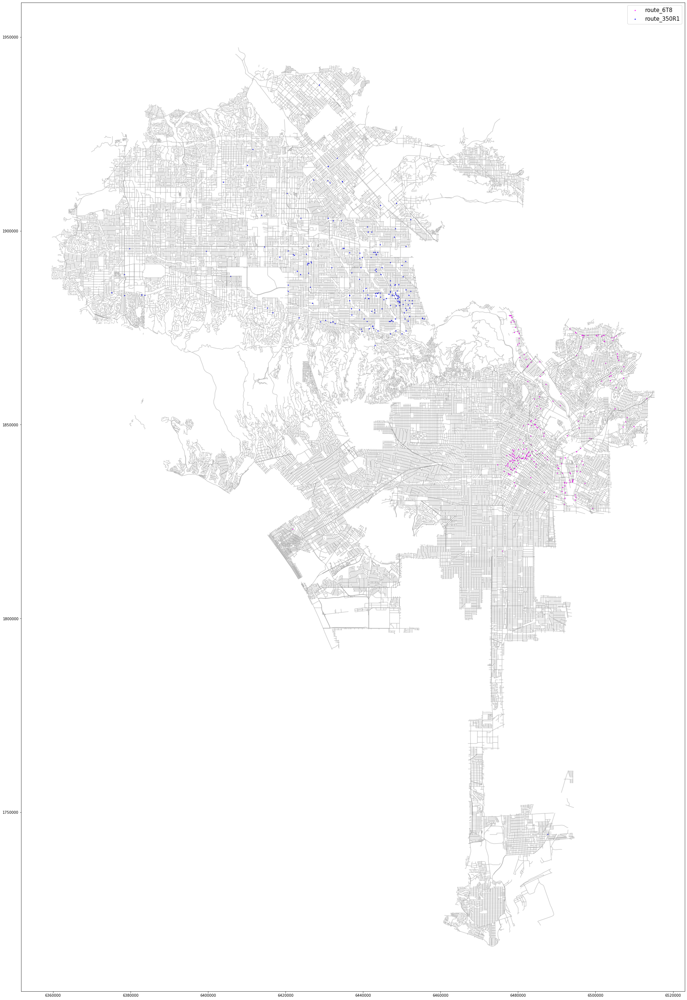

In [26]:
street_map = geopandas.read_file('..\data\street_centerline\Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df[route_6T8].plot(ax=ax, markersize = 5 , color = 'magenta', marker= "^",label = 'route_6T8')
df[route_350R1].plot(ax=ax, markersize = 5 , color = 'blue', marker= "^",label = 'route_350R1')
plt.legend(prop ={'size': 15})

In [27]:
# plot high freqency routes 
route_00600=df['Route']=='00600'
route_00500=df['Route']=='00500'
route_00401=df['Route']=='00401'
route_00402=df['Route']=='00402'
route_00403=df['Route']=='00403'
route_00315=df['Route']=='00315'
route_00309=df['Route']=='00309'
route_00400=df['Route']=='00400'
route_00483=df['Route']=='00483'
route_00107=df['Route']=='00107'

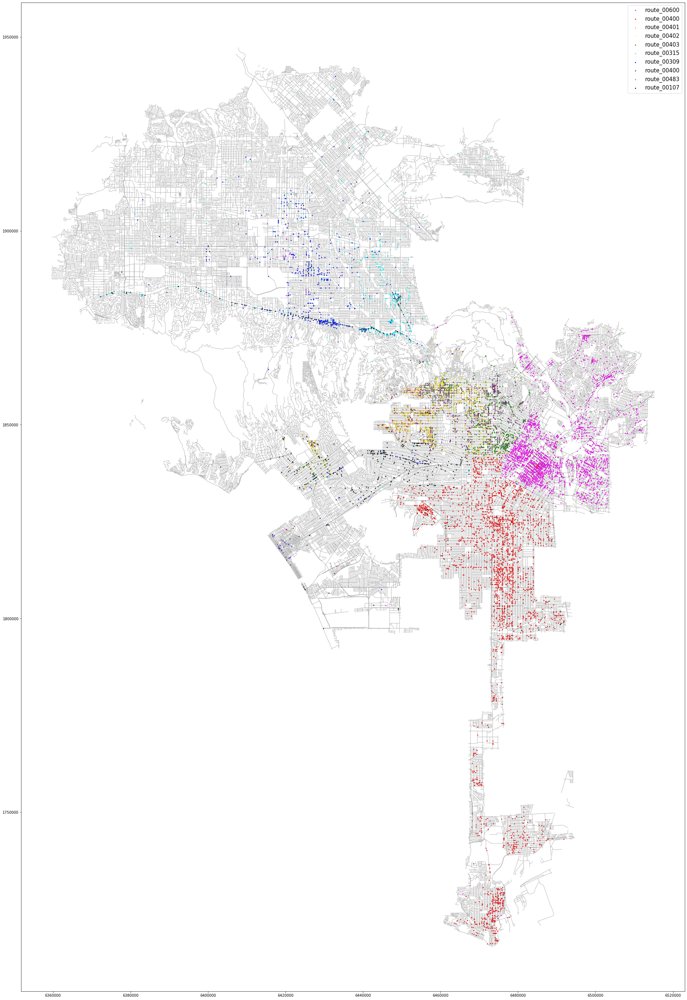

In [28]:
street_map = geopandas.read_file('..\data\street_centerline\Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df[route_00600].plot(ax=ax, markersize = 5 , color = 'magenta', marker= "^",label = 'route_00600')
df[route_00500].plot(ax=ax, markersize = 5 , color = 'red', marker= "^",label = 'route_00400')
df[route_00401].plot(ax=ax, markersize = 5 , color = 'orange', marker= "^",label = 'route_00401')
df[route_00402].plot(ax=ax, markersize = 5 , color = 'yellow', marker= "^",label = 'route_00402')
df[route_00403].plot(ax=ax, markersize = 5 , color = 'green', marker= "^",label = 'route_00403')
df[route_00315].plot(ax=ax, markersize = 5 , color = 'cyan', marker= "^",label = 'route_00315')
df[route_00309].plot(ax=ax, markersize = 5 , color = 'blue', marker= "^",label = 'route_00309')
df[route_00400].plot(ax=ax, markersize = 5 , color = 'purple', marker= "^",label = 'route_00400')
df[route_00483].plot(ax=ax, markersize = 5 , color = 'grey', marker= "^",label = 'route_00483')
df[route_00107].plot(ax=ax, markersize = 5 , color = 'black', marker= "^",label = 'route_00107')
plt.legend(prop ={'size': 15})

In [95]:
'''agency_54 =(df["Agency"]==54.0)&(df["Date"]=="2019/02/04")
agency_51 =(df["Agency"]==51.0)&(df["Date"]=="2019/02/04")
agency_56 =(df["Agency"]==56.0)&(df["Date"]=="2019/02/04")
agency_53 =(df["Agency"]==53.0)&(df["Date"]=="2019/02/04")
agency_1 =(df["Agency"]==1.0)&(df["Date"]=="2019/02/04")
agency_2 =(df["Agency"]==2.0)&(df["Date"]=="2019/02/04")
agency_57 =(df["Agency"]==57.0)&(df["Date"]=="2019/02/04")
agency_4 =(df["Agency"]==4.0)&(df["Date"]=="2019/02/04")
agency_58 =(df["Agency"]==58.0)&(df["Date"]=="2019/02/04")
agency_55 =(df["Agency"]==55.0)&(df["Date"]=="2019/02/04")'''

In [29]:
# plot agency locations 
agency_54 =df["Agency"]==54.0
agency_51 =df["Agency"]==51.0
agency_56 =df["Agency"]==56.0
agency_53 =df["Agency"]==53.0
agency_1 =df["Agency"]==1.0
agency_2 =df["Agency"]==2.0
agency_57 =df["Agency"]==57.0
agency_4 =df["Agency"]==4.0
agency_58 =df["Agency"]==58.0
agency_55 =df["Agency"]==55.0

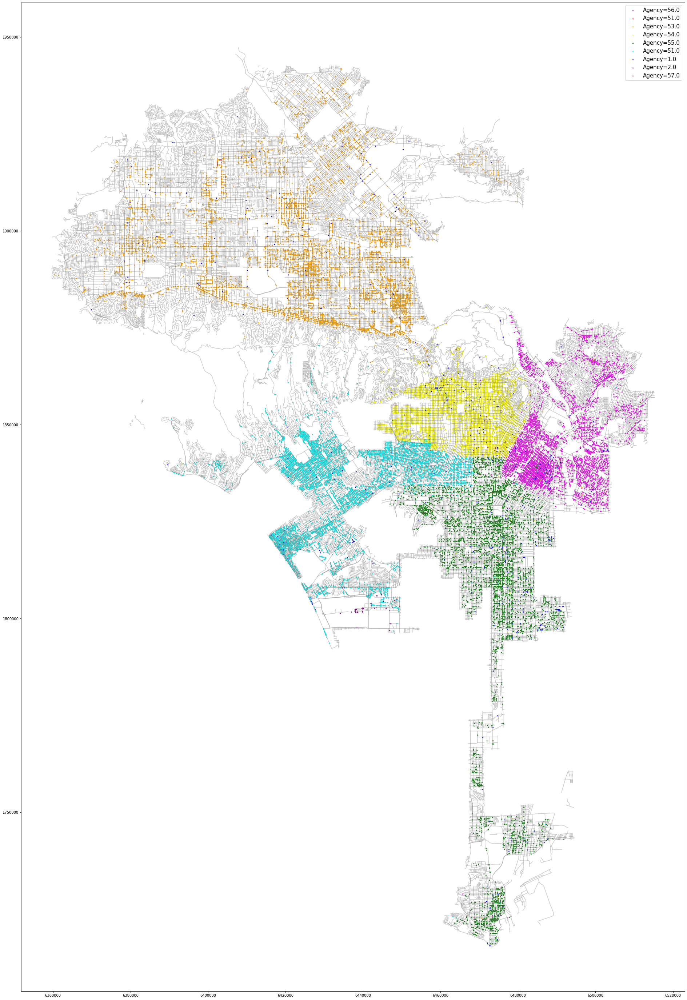

In [30]:
street_map = geopandas.read_file('..\data\street_centerline\Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df[agency_56].plot(ax=ax, markersize = 5 , color = 'magenta', marker= "^",label = 'Agency=56.0')
df[agency_51].plot(ax=ax, markersize = 5 , color = 'red', marker= "^",label = 'Agency=51.0')
df[agency_53].plot(ax=ax, markersize = 5 , color = 'orange', marker= "^",label = 'Agency=53.0')
df[agency_54].plot(ax=ax, markersize = 5 , color = 'yellow', marker= "^",label = 'Agency=54.0')
df[agency_55].plot(ax=ax, markersize = 5 , color = 'green', marker= "^",label = 'Agency=55.0')
df[agency_51].plot(ax=ax, markersize = 5 , color = 'cyan', marker= "^",label = 'Agency=51.0')
df[agency_1].plot(ax=ax, markersize = 5 , color = 'blue', marker= "^",label = 'Agency=1.0')
df[agency_2].plot(ax=ax, markersize = 5 , color = 'purple', marker= "^",label = 'Agency=2.0')
df[agency_57].plot(ax=ax, markersize = 5 , color = 'brown', marker= "^",label = 'Agency=57.0')
plt.legend(prop ={'size': 15})
#agency 50-59 appears to be regional agency, 1-2 appears to be citywide agency
#route starts with 600+ are created by 56, start with 500+ are created by55, and so on.  
#Routes created by agency 1 will contain number 1; routes created by agency 2 will contain number 2

In [31]:
#choose particular day, agency and route 
df_day20190204=df[(df["Date"]=="2019/02/04") & (df['Agency']==56) & (df["Route"]=="00600")].sort_values(by='Issue time', ascending=True)
df_day20190204.head(10)


,Unnamed: 0,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,...,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Date,geometry
9993,995367,4347892220,2019/02/04 12:00:00 AM,157.0,NaN,NaN,CA,NaN,JAGU,PA,...,930 HILL ST S,00600,56.0,80.69AA+,NO STOP/STAND,93.0,6.483647e+06,1.837980e+06,2019/02/04,POINT (6483646.615 1837979.828)
9979,993567,4349082253,2019/02/04 12:00:00 AM,207.0,NaN,NaN,FL,NaN,NISS,PA,...,112 5TH ST W,00600,56.0,80.69B,NO PARKING,73.0,6.486320e+06,1.839512e+06,2019/02/04,POINT (6486319.916 1839511.852)
9992,995361,4347892286,2019/02/04 12:00:00 AM,211.0,NaN,NaN,CA,NaN,HOND,PA,...,510 SPRING ST S,00600,56.0,80.69B,NO PARKING,73.0,6.486006e+06,1.839669e+06,2019/02/04,POINT (6486006.142 1839669.061)
9990,994900,4348090316,2019/02/04 12:00:00 AM,215.0,NaN,NaN,CA,NaN,FORD,PA,...,1314 EAGLE VISTA DR,00600,56.0,5204A-,DISPLAY OF TABS,25.0,6.503326e+06,1.874111e+06,2019/02/04,POINT (6503326.124 1874111.088)
9981,994018,4348448484,2019/02/04 12:00:00 AM,1342.0,CB1090,NaN,CA,NaN,MERZ,PA,...,645 9TH ST W,00600,56.0,88.13B+,METER EXP.,63.0,6.482646e+06,1.839020e+06,2019/02/04,POINT (6482645.558 1839019.766)
10004,996919,4347003824,2019/02/04 12:00:00 AM,1403.0,NaN,NaN,CA,NaN,TOYT,PA,...,502 MATHEWS ST S,00600,56.0,80.69AA+,NO STOP/STAND,93.0,6.497531e+06,1.836463e+06,2019/02/04,POINT (6497530.709 1836463.385)
10007,997135,4346403364,2019/02/04 12:00:00 AM,1440.0,NaN,1250.0,CA,NaN,NISS,PA,...,1124 CHICAGO ST N,00600,56.0,80.69C,PARKED OVER TIME LIMIT,58.0,6.499337e+06,1.842992e+06,2019/02/04,POINT (6499337.149 1842992.165)


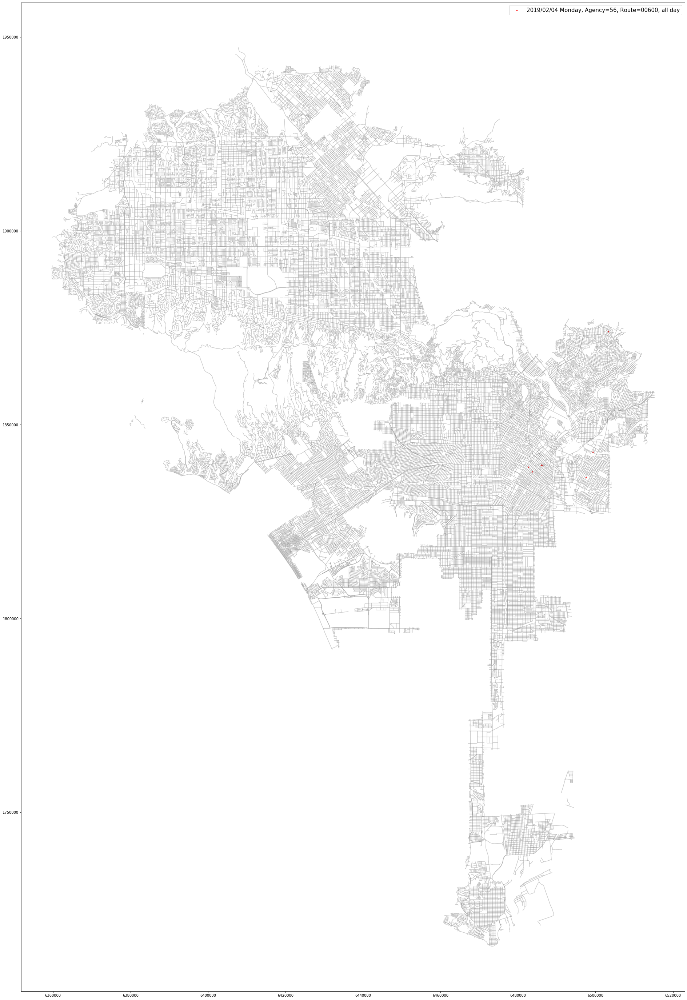

In [32]:
street_map = geopandas.read_file('..\data\street_centerline\Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df_day20190204.plot(ax=ax, markersize = 10 , color = 'red', marker= "^",label = '2019/02/04 Monday, Agency=56, Route=00600, all day')
plt.legend(prop ={'size': 15})
